# Image2text


##Images description

In [ ]:
!pip install torch==1.12.1
!git clone https://github.com/salesforce/LAVIS
%cd LAVIS
!pip install .

In [ ]:
import torch
from PIL import Image

from lavis.models import load_model_and_preprocess

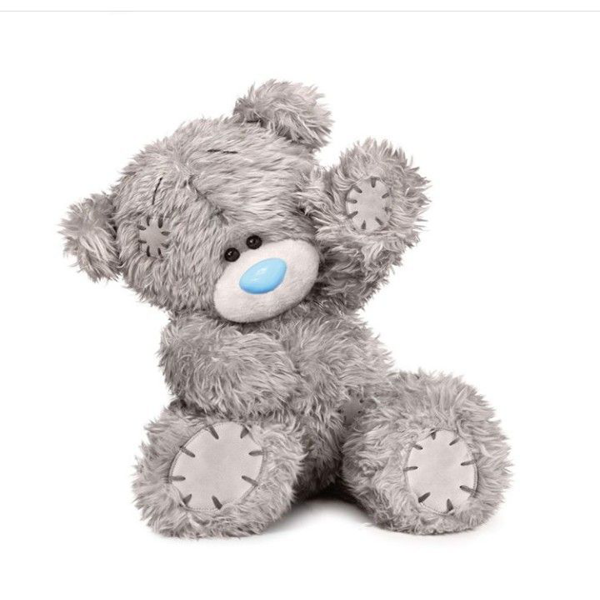

In [ ]:
import requests

img_url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((600, 600)))
#ansver: a teddy bear holding a small blue pacifier

In [ ]:
# setup device to use
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# we associate a model with its preprocessors to make it easier for inference.
model, vis_processors, _ = load_model_and_preprocess(
    name="blip_caption", model_type="large_coco", is_eval=True, device=device
)

#vis_processors.keys()
image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)

In [ ]:
# due to the non-determinstic nature of necleus sampling, you may get different captions.
model.generate({"image": image}, use_nucleus_sampling=True, num_captions=4)

['a teddy bear holding a small blue pacifier',
 'a very cute furry teddy bear with a blue nose',
 'a grey teddy bear with a blue nose',
 'a teddy bear with a blue nose sits upright']

# Stable Diffusion - Img2Img 🎨

##install

In [ ]:
# make sure you are running in GPU
!nvidia-smi

In [ ]:
!pip install -U diffusers-interpret
!pip install matplotlib==3.1.3

### 0 - Login in HuggingFace's Hub

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

from huggingface_hub import notebook_login
notebook_login()

### 1 - Initialize `StableDiffusionImg2ImgPipeline` normally

In [ ]:
# make sure you're logged in by running the previous cell or `huggingface-cli login`
import torch
from contextlib import nullcontext
import requests
from PIL import Image
from io import BytesIO

from diffusers import StableDiffusionImg2ImgPipeline


device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    use_auth_token=True,
    
    # FP16 is not working for 'cpu'
    revision='fp16' if device != 'cpu' else None,
    torch_dtype=torch.float16 if device != 'cpu' else None
).to(device)
pipe.enable_attention_slicing() # comment this line if you wish to deactivate this option

### 2 - Pass `StableDiffusionImg2ImgPipeline` to `StableDiffusionImg2ImgPipelineExplainer`

In [ ]:
from diffusers_interpret import StableDiffusionImg2ImgPipelineExplainer

explainer = StableDiffusionImg2ImgPipelineExplainer(pipe, gradient_checkpointing=True)

#Example Scala 
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


###painting in the style of Banksy

  0%|          | 0/31 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


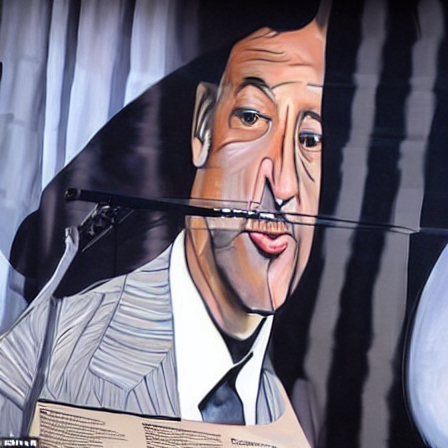

In [ ]:
init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.6, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/26 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


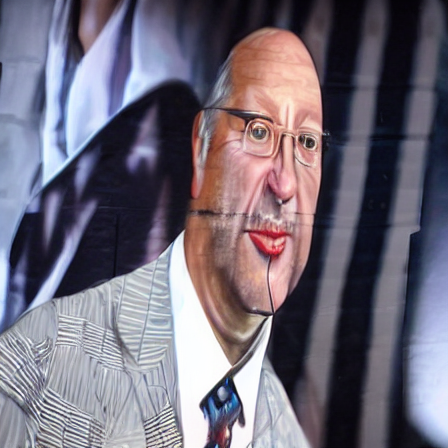

In [ ]:
prompt = "painting in the style of Pieter Cornelis person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.5, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


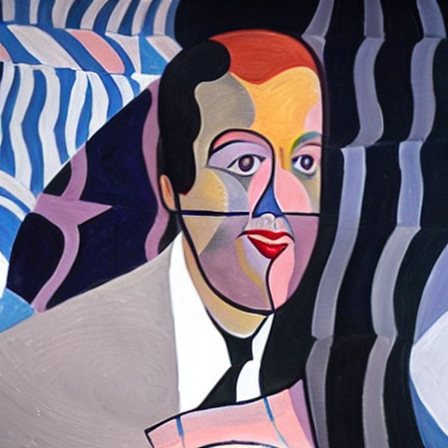

In [ ]:
prompt = "painting in the style of Robert Delaunay person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich 

  0%|          | 0/31 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


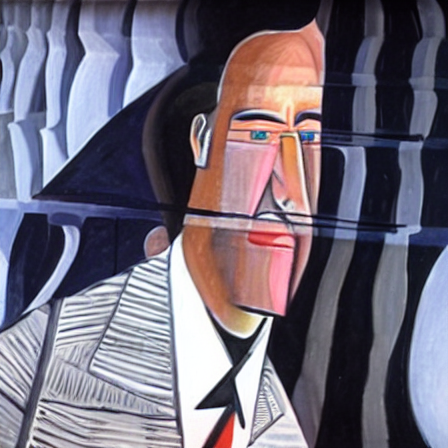

In [ ]:
prompt = "painting in the style of Malevich person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.6, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


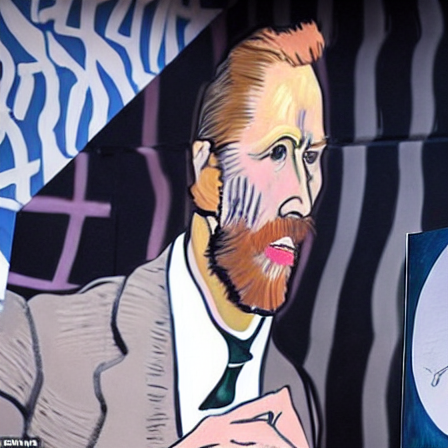

In [ ]:
prompt = "painting in the style of  Vincent Van Gogh person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example Rita
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy photo girl with makeup

In [ ]:
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, guidance_scale=0.5, generator=generator
    )

  0%|          | 0/41 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


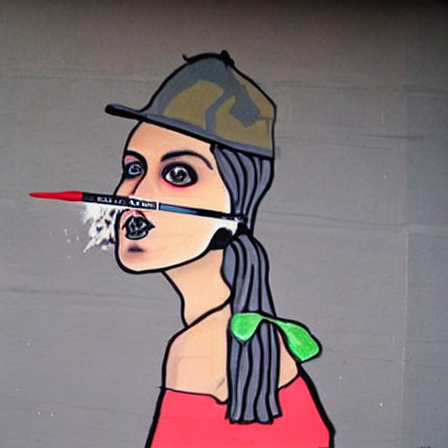

In [ ]:
# Final generated image 
output.image

###painting in the style of Pieter Cornelis photo girl with makeup

In [ ]:
prompt = "painting in the style of Pieter Cornelis photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


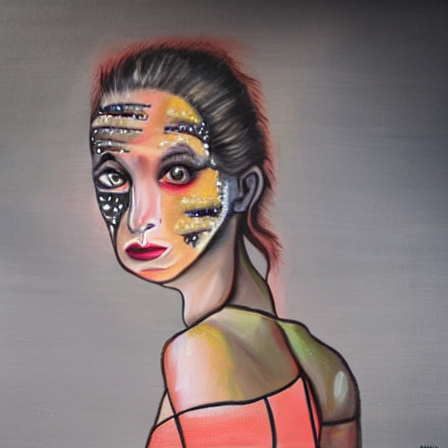

In [ ]:
# Final generated image 
output.image

###painting in the style of Robert Delaunay photo girl with makeup

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


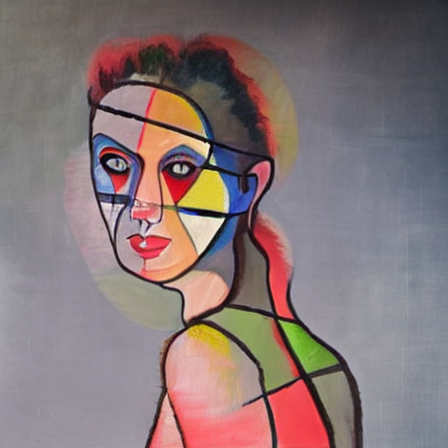

In [ ]:
prompt = "painting in the style of Robert Delaunay photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh photo girl with makeup

  0%|          | 0/41 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


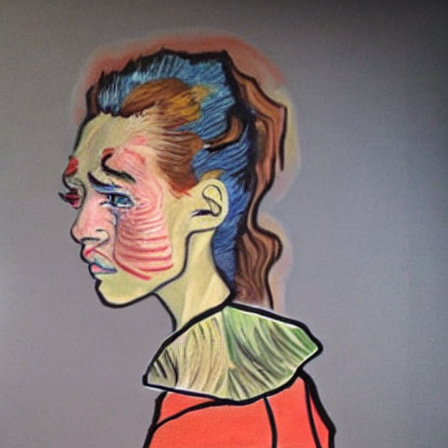

In [ ]:
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.8, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich photo girl with makeup

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


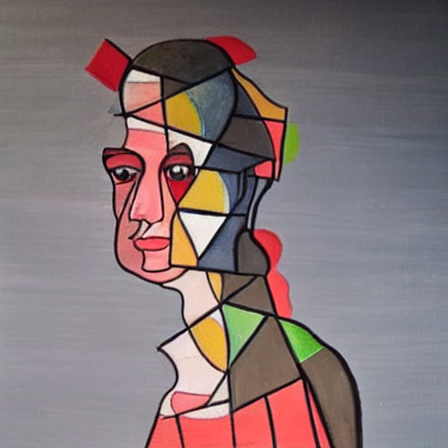

In [ ]:
prompt = "painting in the style of Malevich photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example boy 
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... 

/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:13: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())
/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:17: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())


Done!


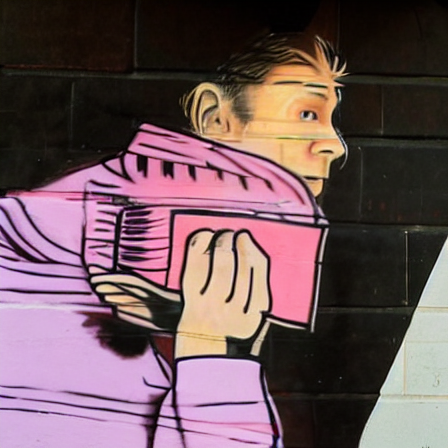

In [ ]:
prompt = 'painting in the style of Banksy photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = ""


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


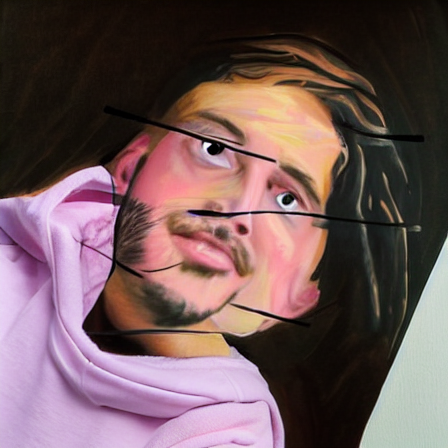

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo man in pink hoodie and white shirt posing for a picture'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


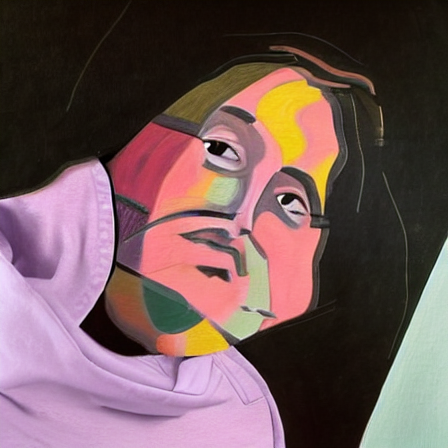

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo man in pink hoodie and white shirt posing for a picture'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


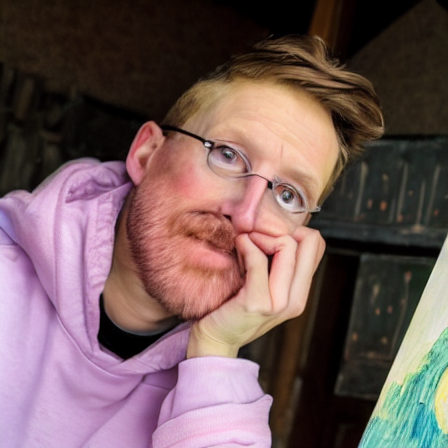

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo man in pink hoodie and white shirt posing for a picture'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


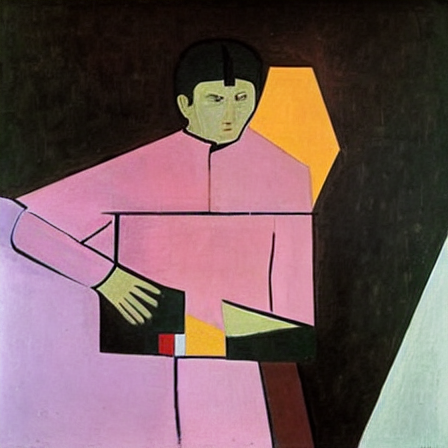

In [ ]:
prompt = 'painting in the style of Malevich photo man in pink hoodie and white shirt posing for a picture'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example squirrel  
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


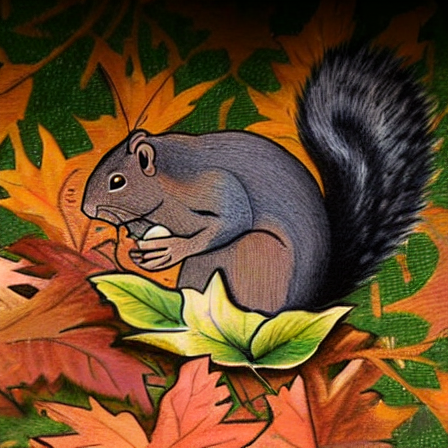

In [ ]:
prompt = 'painting in the style of Banksy photo a small brown and black squirrel standing on top of leaves'

# let's download an initial image
url = '' 


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


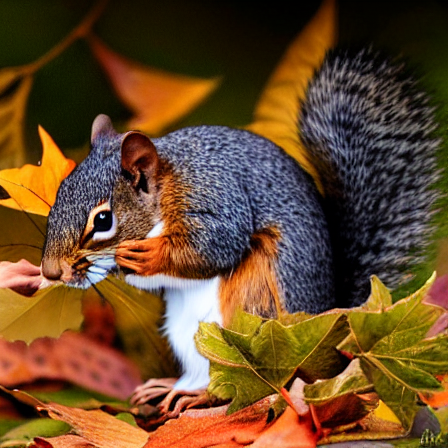

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a small brown and black squirrel standing on top of leaves'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


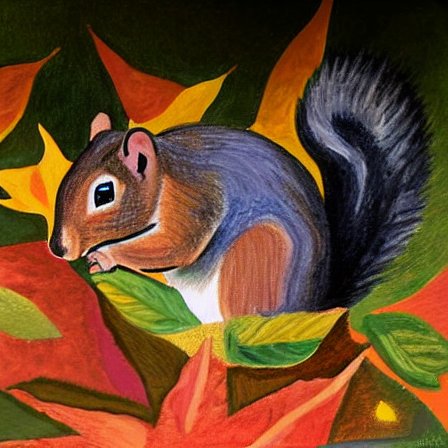

In [ ]:
prompt = 'painting in the style of Robert Delaunay a small brown and black squirrel standing on top of leaves'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


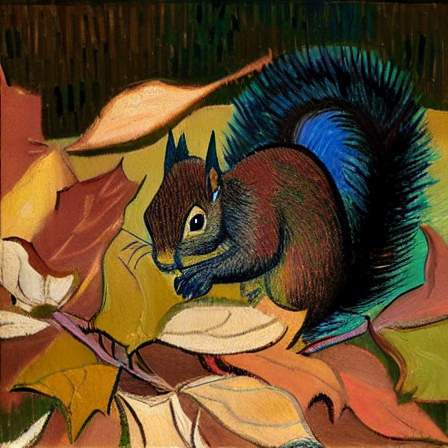

In [ ]:
prompt = 'SQURREL painting in the style of Vincent Van Gogh a small brown and black squirrel standing on top of leaves'

generator = torch.Generator(device).manual_seed(4)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example toy 
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... 

/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:13: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())
/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:17: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())


Done!


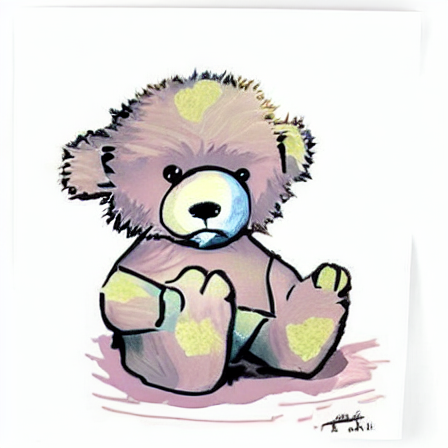

In [ ]:
prompt = 'painting in the style of Banksy on the wall photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = " "


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


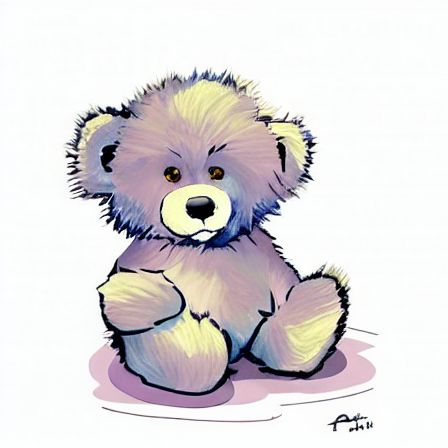

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a very cute furry teddy bear with a blue nose'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.65, guidance_scale=7.5, generator=generator
    )

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


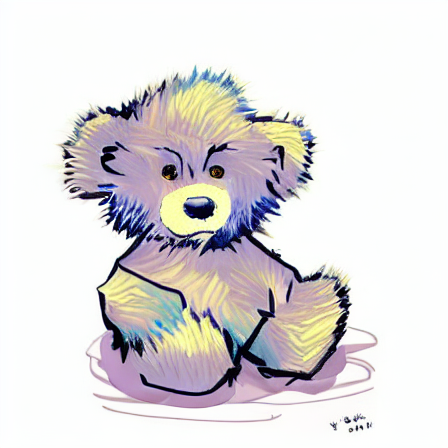

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo a very cute furry teddy bear with a blue nose'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


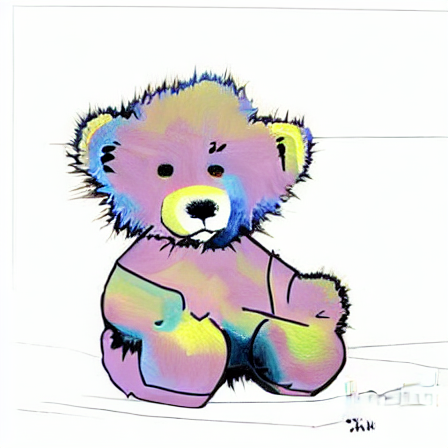

In [ ]:
prompt = 'painting in the style of Malevich photo a very cute furry teddy bear with a blue nose'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

# Example girl
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


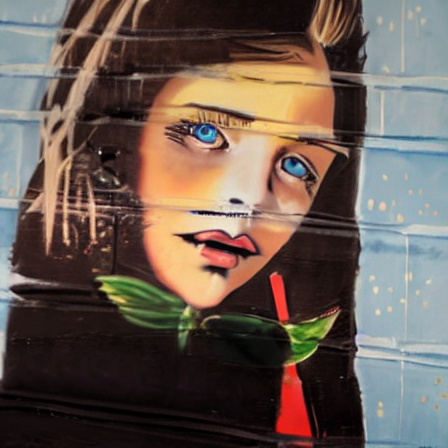

In [ ]:
prompt = 'painting in the style of Banksy photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = ""

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


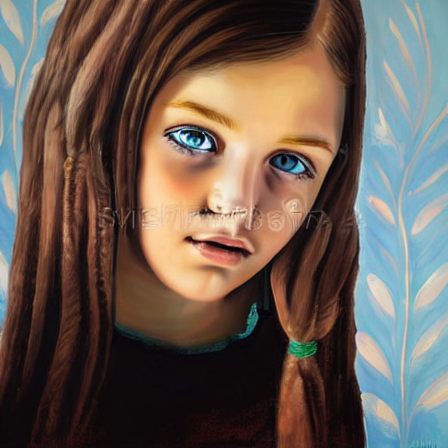

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a girl with blue eyes posing for the camera'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


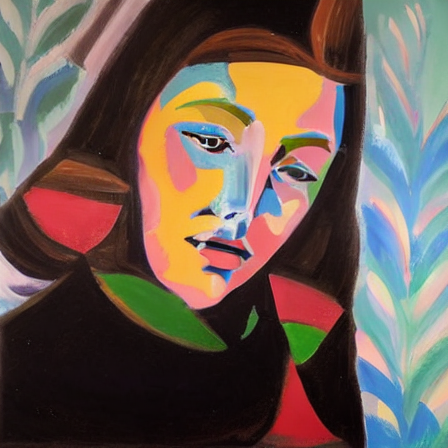

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo a girl with blue eyes posing for the camera'


generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


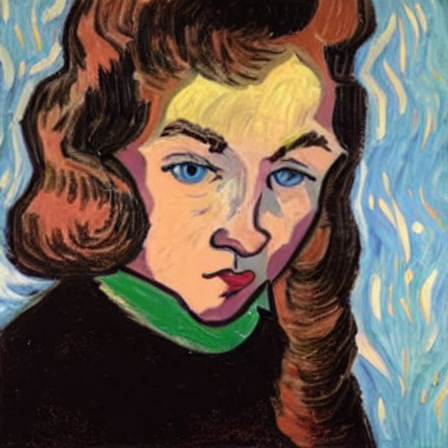

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo a girl with blue eyes posing for the camera'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


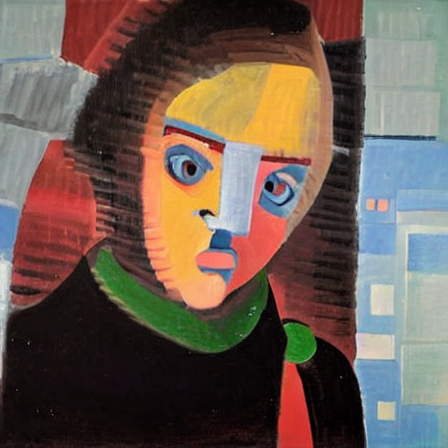

In [ ]:
prompt = 'painting in the style of Malevich photo a girl with blue eyes posing for the camera'

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image